#Universidade Federal de Santa Catarina - IEB(UFSC)
#Introdução a Informatica Medica
##Alunos(as):
#        João Lucas Pereira dos Santos de Paula - Me. Eng Eletrica - Engenheiro Eletricista
#        Débora Cristina Soares Bandeira - Me. Eng Eletrica - Engenheira Eletricista





In [ ]:

!pip install biosppy
import numpy as np
import matplotlib.pyplot as plt
import pywt
import biosppy
import os
from google.colab import drive
from scipy.signal import normalize, butter, filtfilt, cwt
from scipy.signal import find_peaks
from biosppy.signals import ecg
!pip install peakutils
import peakutils

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.0/107.0 kB 2.4 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Tratamento do Sinal de ECG e Aquisição dos Picos R-R


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[-0.68359 -0.6123  -0.56152 ... -0.75879 -0.77734 -0.7998 ]
300000


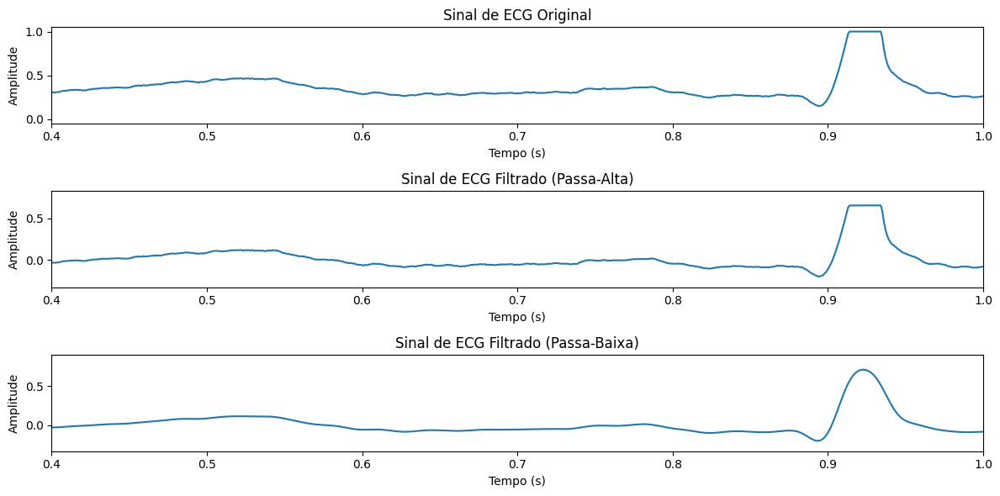

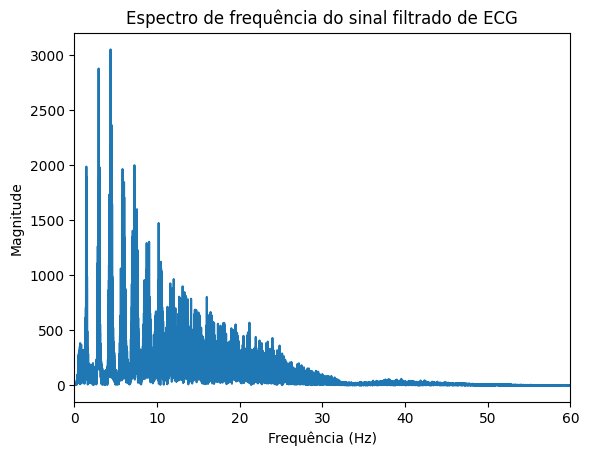

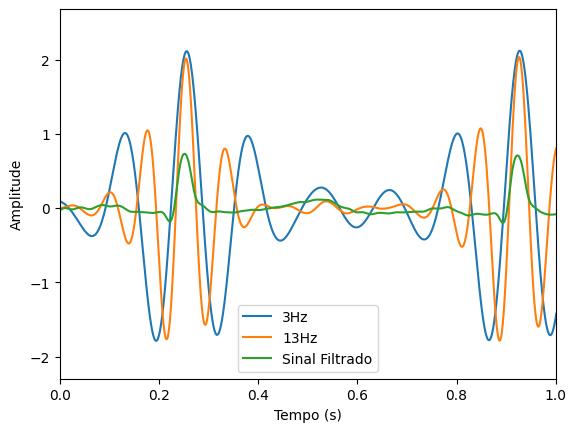

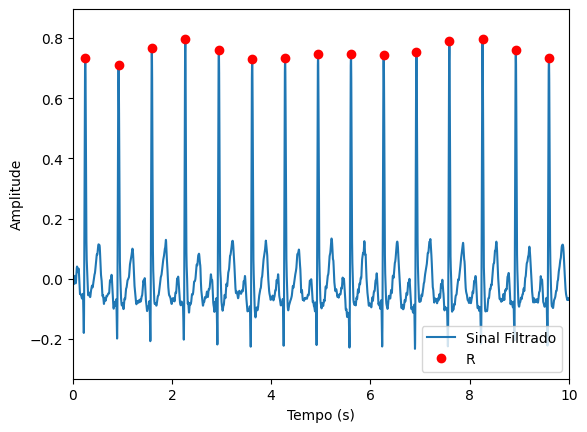

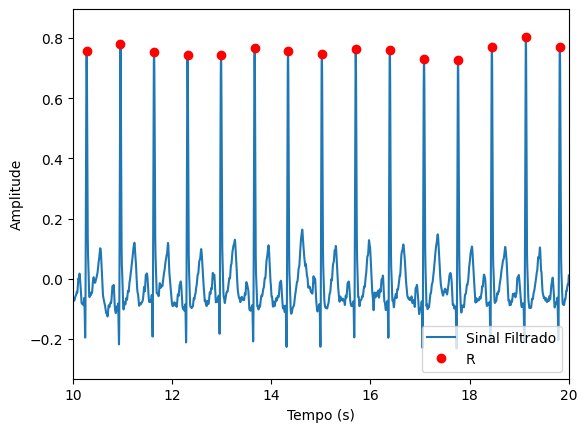

...

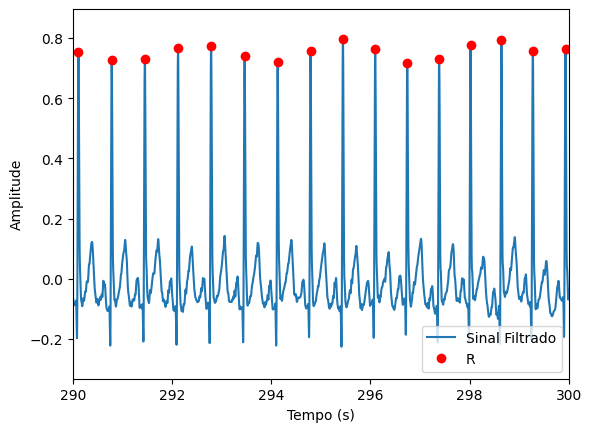

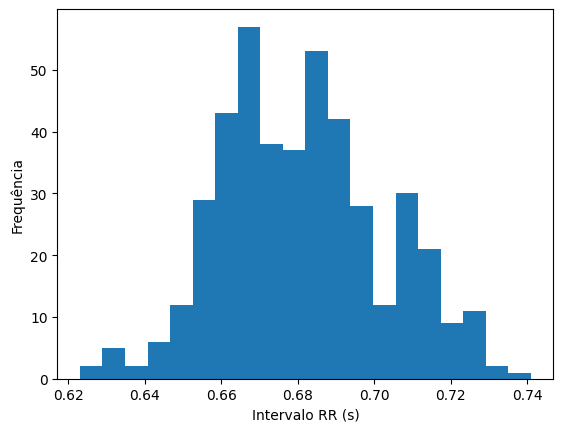

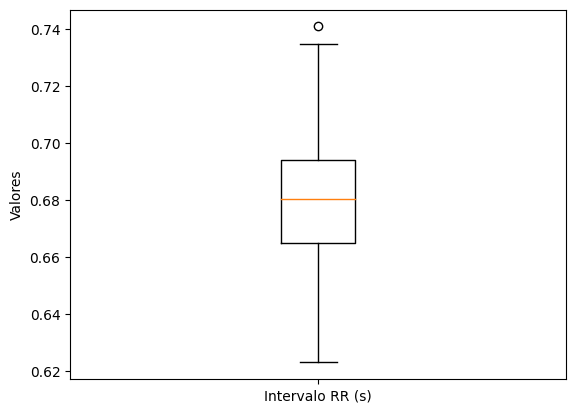

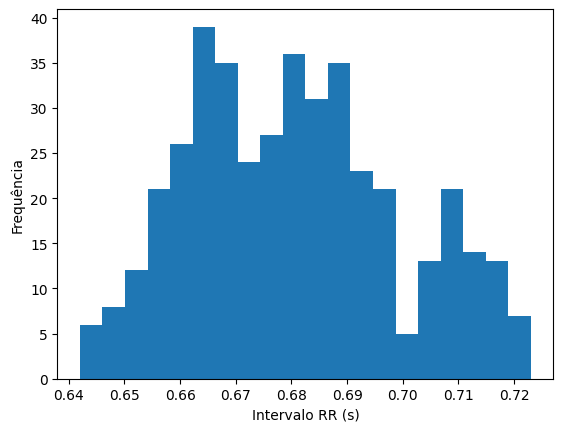

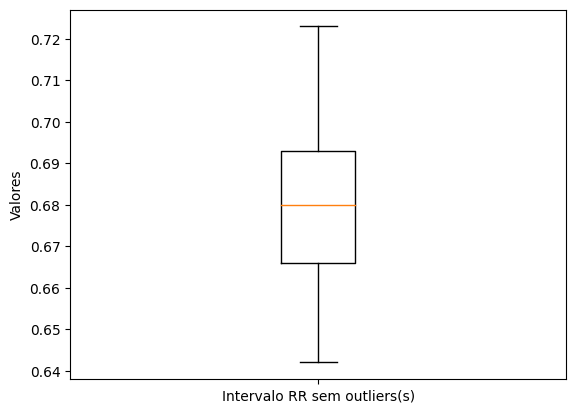

Mean RR: 0.681 s
BPM: 88.157 qtd
SDNN: 18.637 ms
RMSSD: 6.958 ms
PNN50: 0.000%
PNN30: 0.000%
PNN20: 0.721%
[   251    923   1593   2268   2944   3617   4281   4945   5608   6268
   6928   7592   8261   8932   9600  10279  10962  11639  12314  12989
  13666  14339  15021  15705  16392  17082  17767  18450  19135  19820
  20499  21184  21867  22550  23236  23917  24612  25336  26051  26768
  27471  28181  28875  29567  30248  30929  31597  32267  32938  33597
  34257  34915  35573  36239  36903  37564  38219  38885  39550  40217
  40879  41559  42237  42906  43573  44236  44892  45538  46169  46818
  47483  48166  48861  49568  50277  50984  51699  52411  53111  53797
  54479  55161  55842  56526  57218  57921  58618  59326  60033  60759
  61490  62215  62933  63656  64373  65087  65805  66528  67239  67954
  68673  69390  70114  70819  71525  72232  72942  73654  74366  75068
  75776  76483  77193  77894  78591  79293  79986  80674  81364  82052
  82741  83431  84128  84833  85542  8626

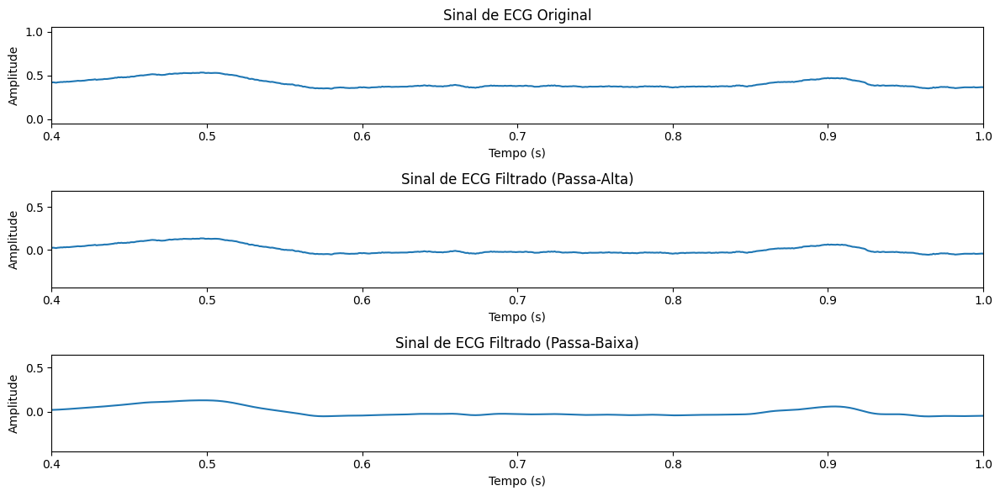

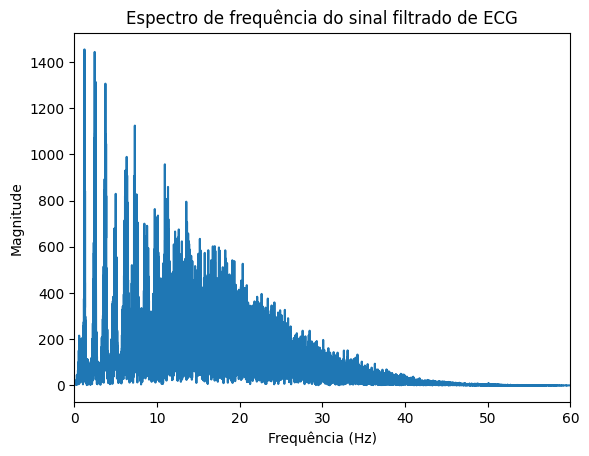

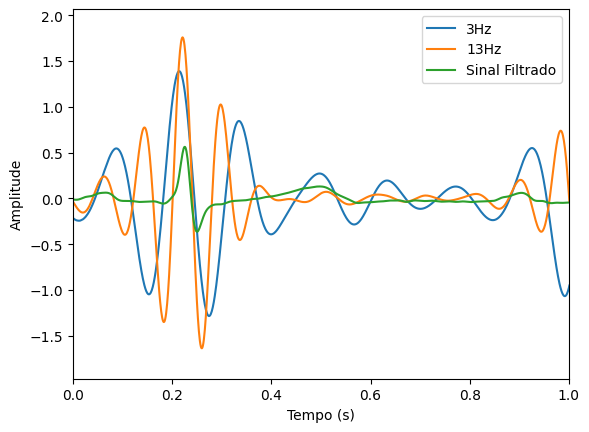

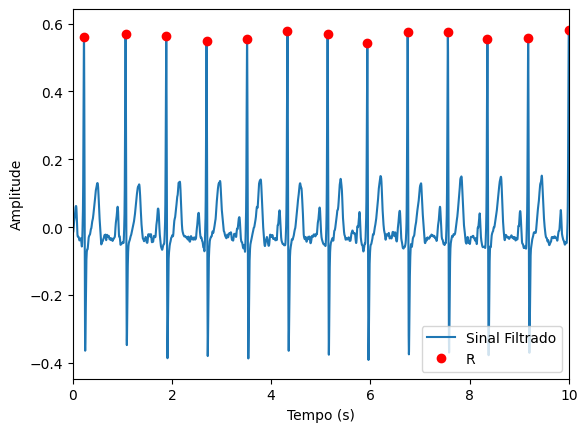

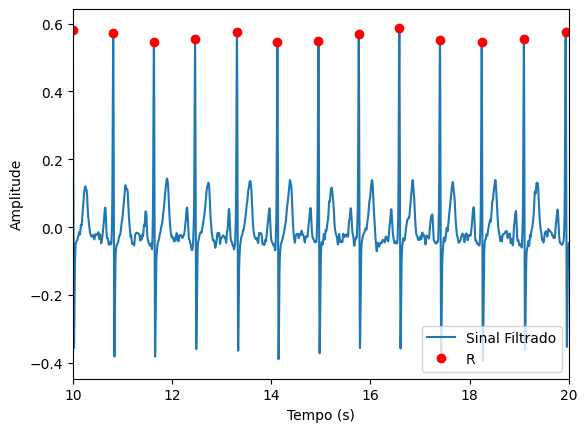

...

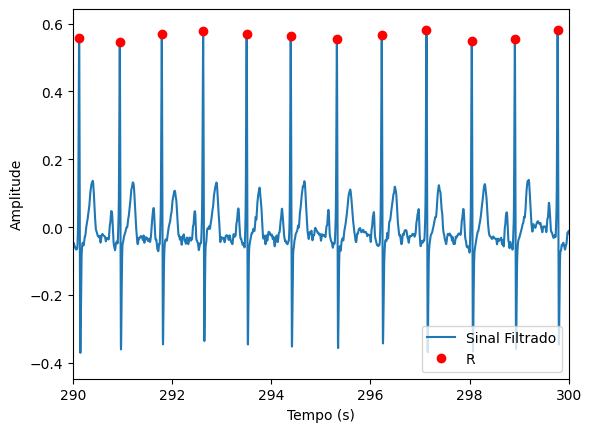

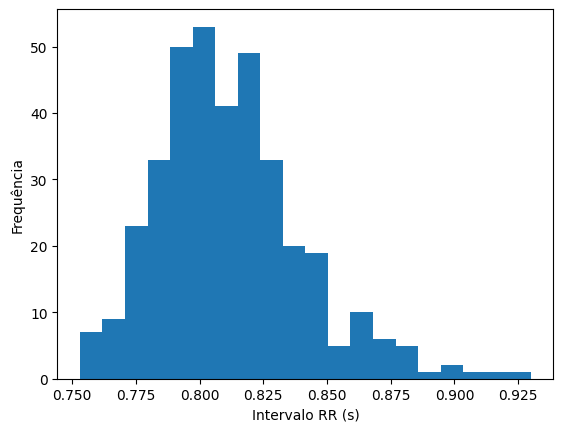

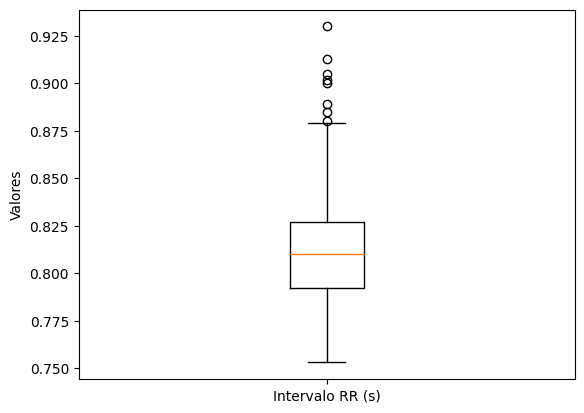

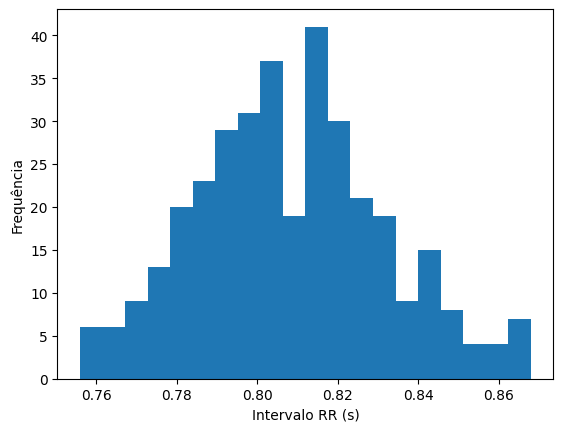

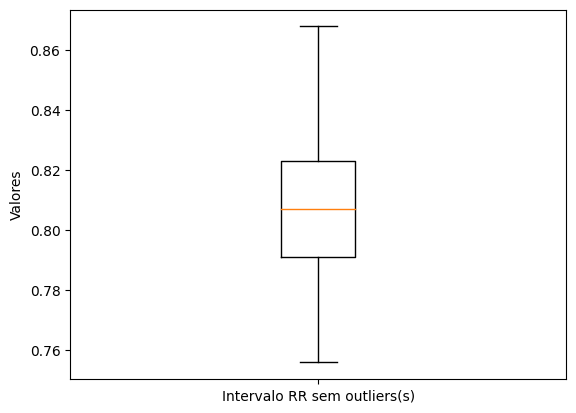

Mean RR: 0.808 s
BPM: 74.229 qtd
SDNN: 23.473 ms
RMSSD: 14.296 ms
PNN50: 0.000%
PNN30: 2.571%
PNN20: 17.143%
[   225   1064   1884   2697   3514   4328   5138   5938   6751   7562
   8359   9181   9999  10815  11635  12465  13310  14125  14952  15765
  16583  17402  18244  19094  19936  20767  21592  22422  23241  24068
  24901  25718  26537  27355  28182  29011  29857  30680  31505  32315
  33121  33910  34713  35527  36323  37131  37912  38706  39467  40260
  41074  41896  42713  43537  44358  45163  45960  46766  47541  48337
  49120  49900  50699  51473  52234  53008  53808  54587  55378  56172
  56975  57760  58563  59373  60185  61000  61822  62646  63474  64305
  65108  65936  66754  67568  68365  69168  69960  70735  71525  72324
  73113  73912  74715  75520  76313  77084  77840  78609  79370  80144
  80914  81702  82473  83254  84050  84838  85619  86408  87203  87985
  88765  89545  90327  91113  91892  92683  93455  94221  94987  95789
  96579  97362  98136  98933  99718 100

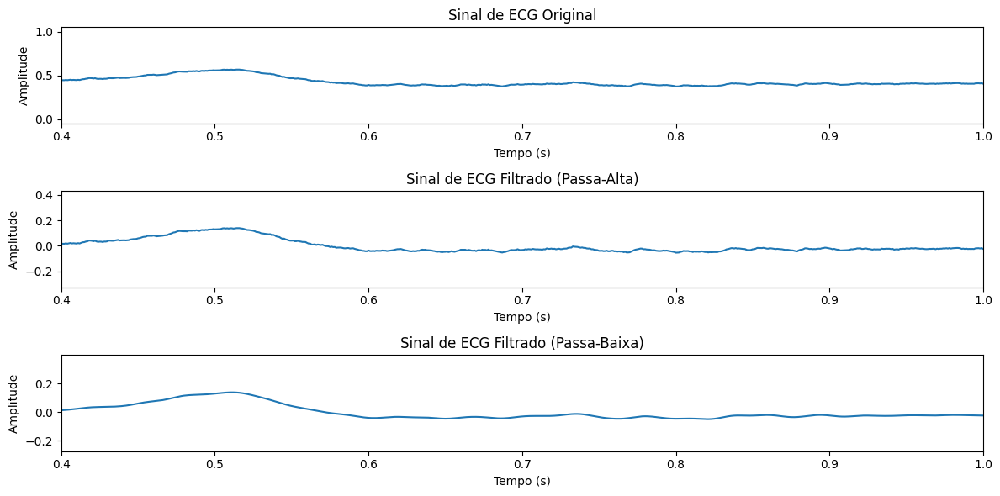

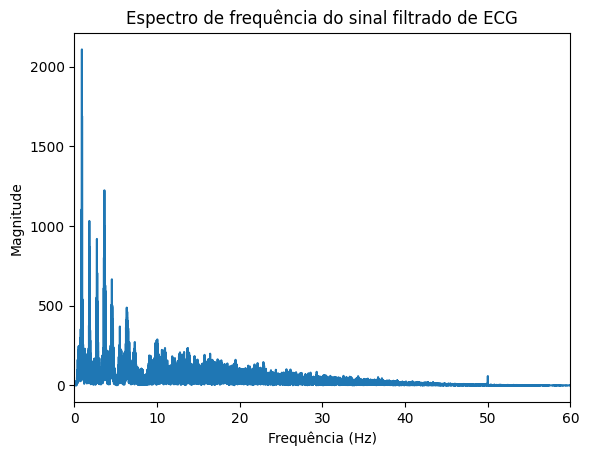

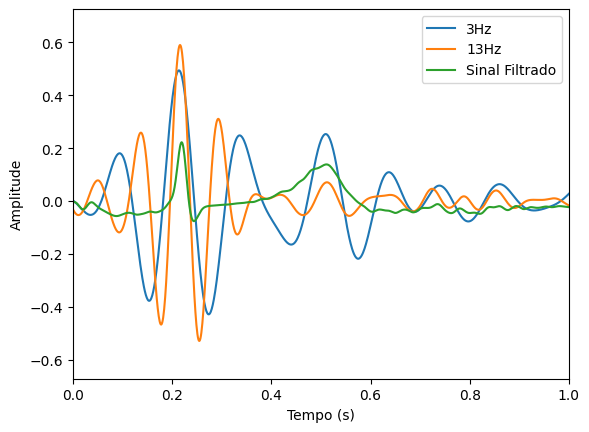

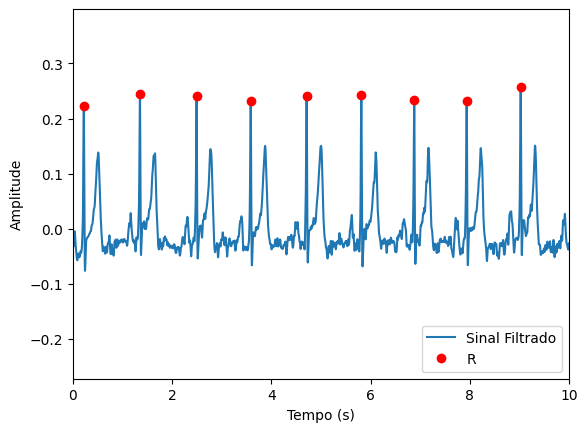

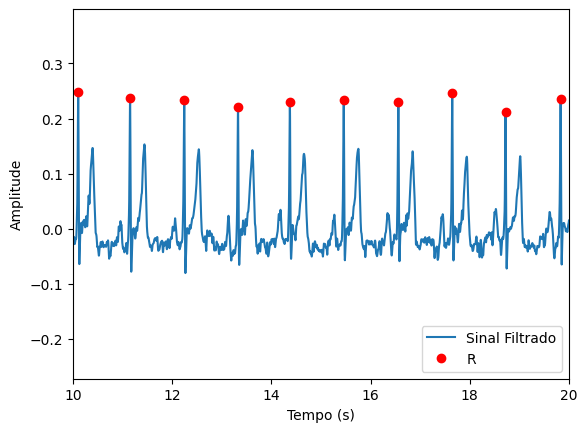

...

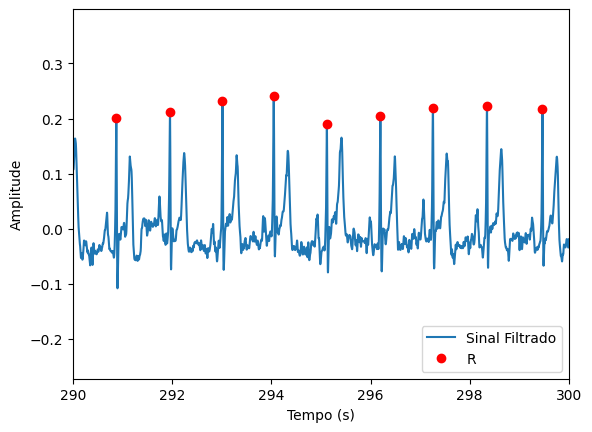

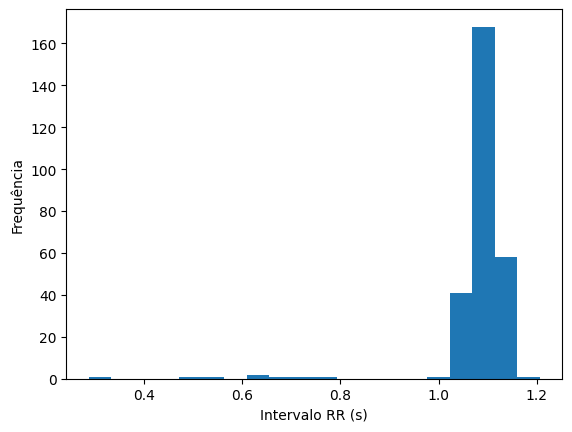

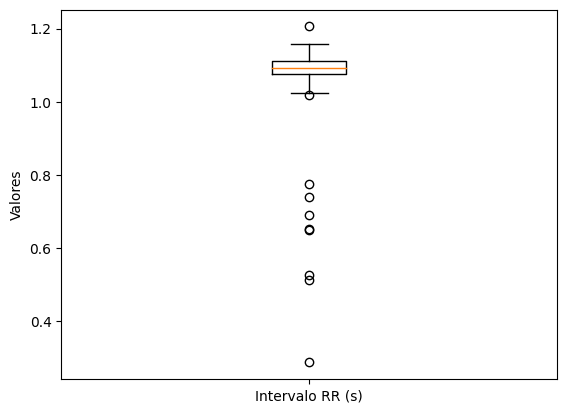

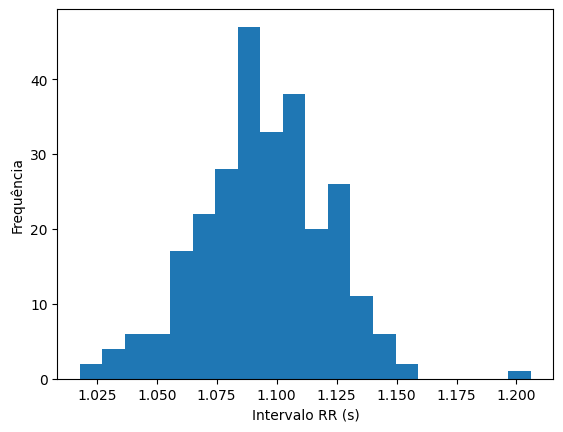

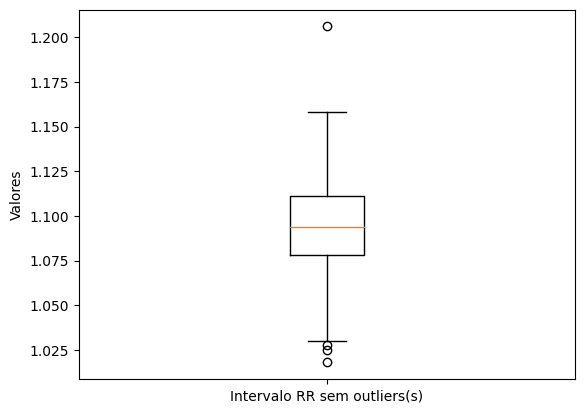

Mean RR: 1.094 s
BPM: 54.822 qtd
SDNN: 26.832 ms
RMSSD: 29.313 ms
PNN50: 4.104%
PNN30: 27.985%
PNN20: 49.254%
[   219   1351   2493   3584   4712   5814   6881   7939   9027  10106
  11152  12244  13328  14374  15460  16561  17647  18722  19832  20928
  22005  23100  24161  25200  26218  27274  28347  29394  30489  31587
  32672  33800  34941  36050  37176  38281  39396  40525  41599  42704
  43834  44930  46056  47186  48312  49449  50590  51735  52841  53999
  55097  56201  57327  58452  59548  60684  61786  62880  63998  65090
  66156  67243  68371  69435  70538  71659  72752  73846  74953  76042
  77135  78229  79314  80380  81464  82539  83604  84708  85836  86930
  88039  89179  90280  91418  92541  93652  94741  95865  97009  98122
  99253 100409 101515 102635 103754 104886 105977 107122 108250 109355
 110475 111603 112687 113788 114902 115989 117092 118207 119316 120409
 121536 122630 123725 124832 125923 127002 128105 129206 130284 131389
 132491 133574 134680 135780 136870 13

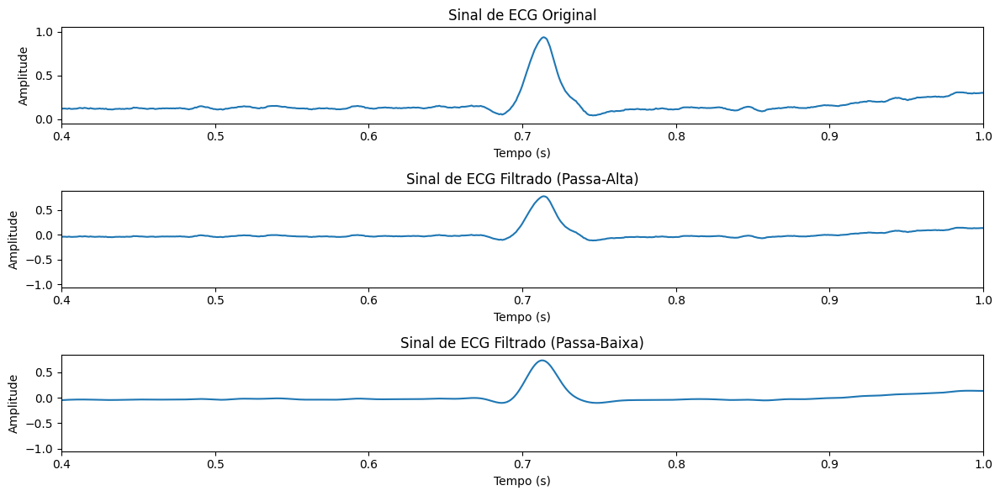

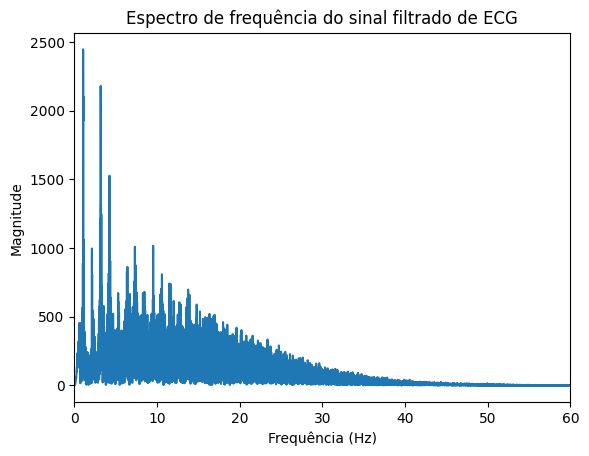

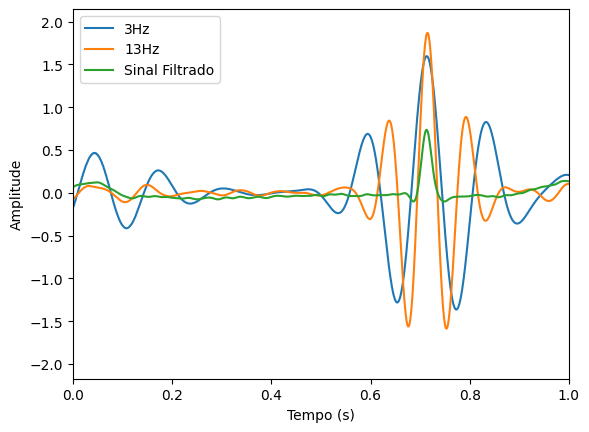

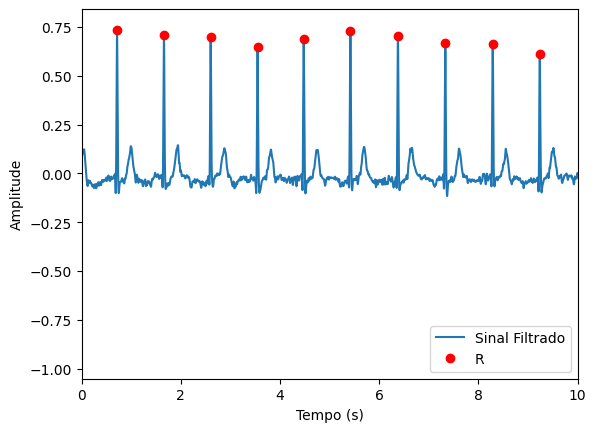

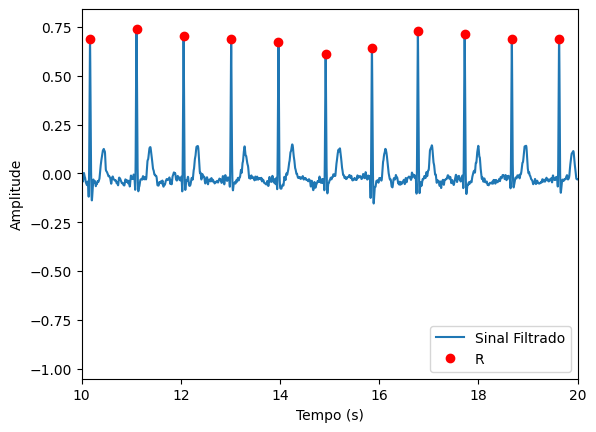

...

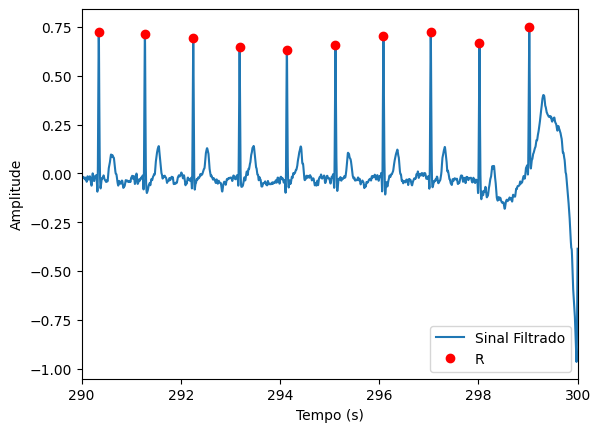

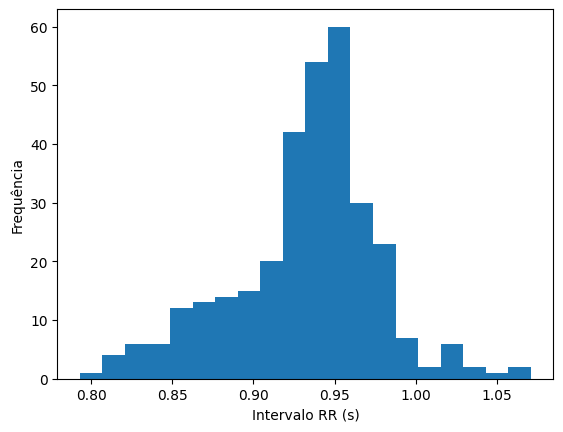

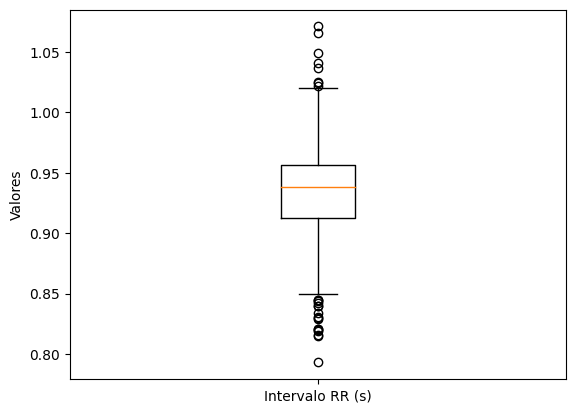

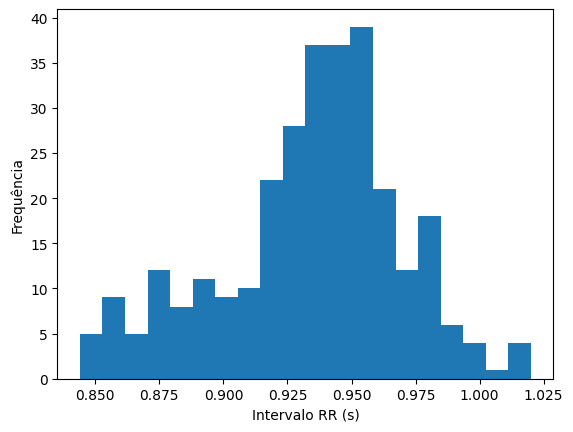

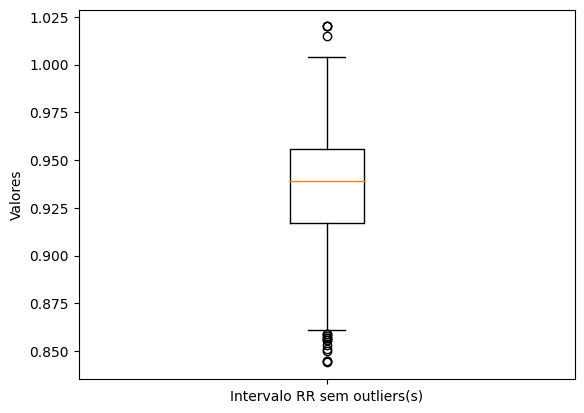

Mean RR: 0.934 s
BPM: 64.218 qtd
SDNN: 35.598 ms
RMSSD: 36.709 ms
PNN50: 12.458%
PNN30: 35.354%
PNN20: 50.168%
[   713   1659   2601   3546   4477   5417   6376   7331   8288   9236
  10168  11106  12054  13014  13967  14918  15852  16778  17721  18672
  19626  20579  21511  22445  23397  24353  25305  26255  27193  28128
  29067  30006  30952  31901  32832  33765  34711  35658  36619  37566
  38492  39436  40389  41339  42287  43224  44164  45107  46052  46980
  47898  48830  49767  50707  51634  52549  53450  54306  55146  56059
  57000  57851  58716  59615  60564  61505  62398  63257  64088  64960
  65942  66925  67873  68731  69571  70416  71346  72383  73405  74399
  75363  76308  77257  78186  79105  79962  80823  81644  82465  83327
  84142  85208  86118  87053  88019  88947  89831  90777  91733  92696
  93652  94545  95444  96375  97333  98296  99252 100228 101118 102029
 102979 103931 104855 105748 106634 107478 108297 109172 110196 111174
 112134 113017 113867 114701 115581 1

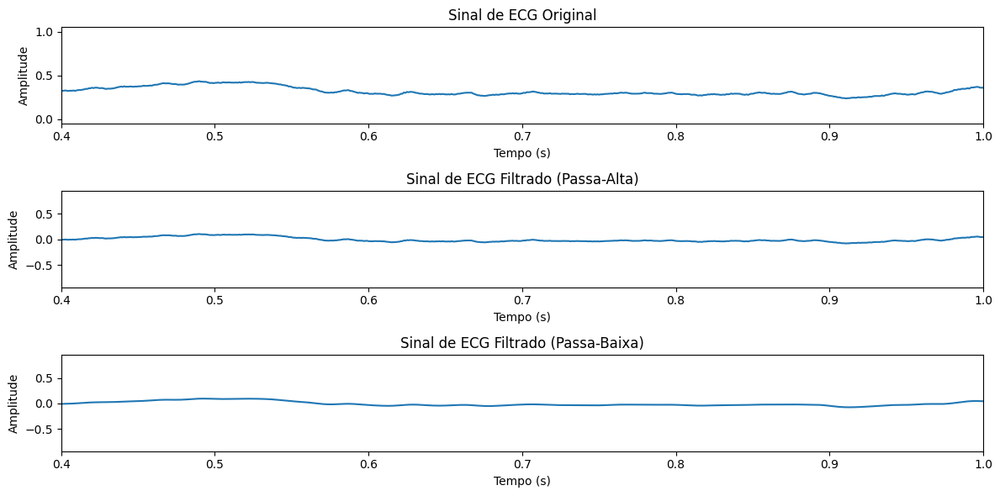

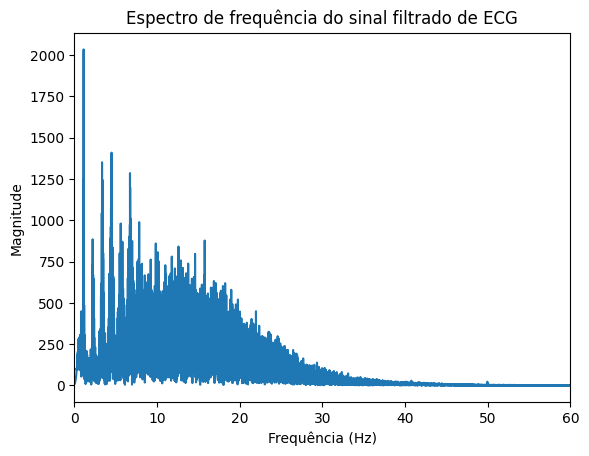

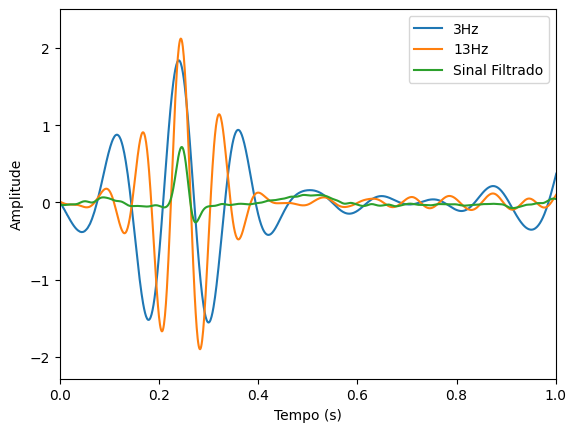

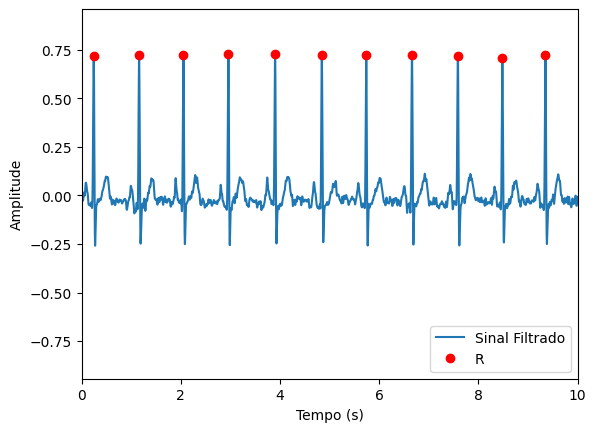

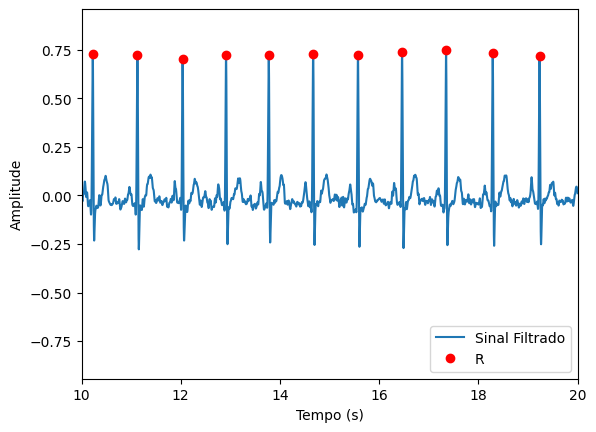

...

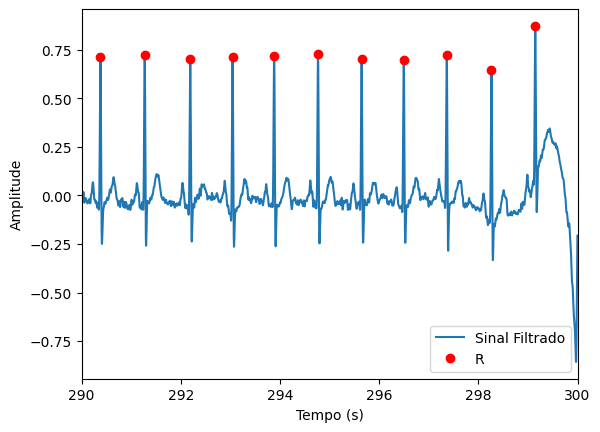

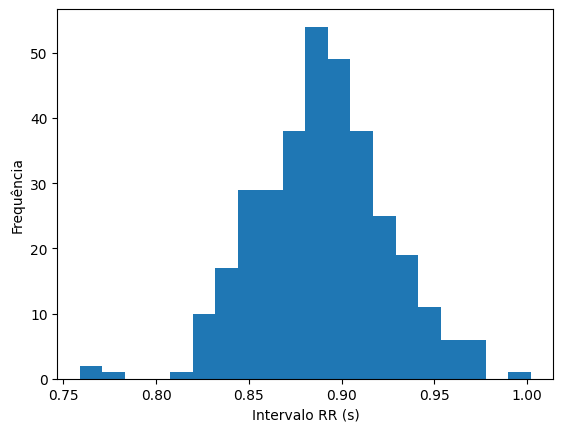

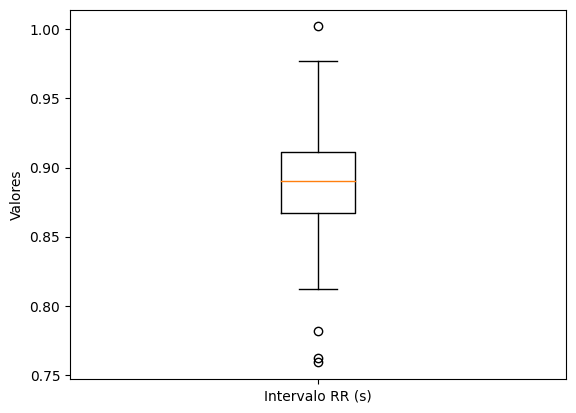

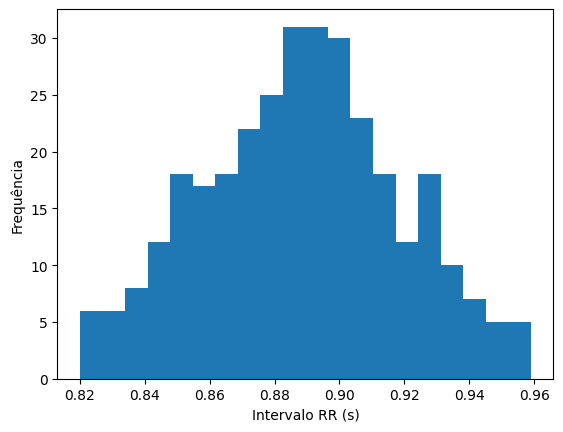

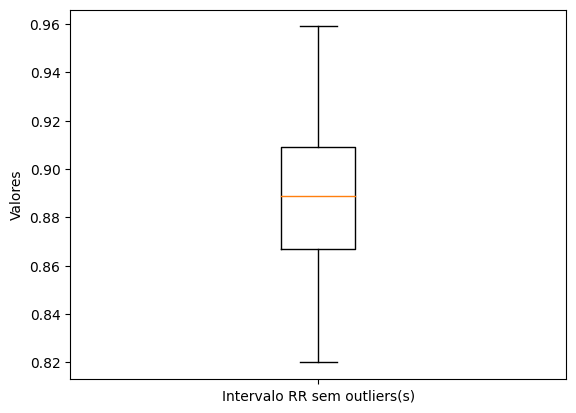

Mean RR: 0.888 s
BPM: 67.538 qtd
SDNN: 30.445 ms
RMSSD: 31.695 ms
PNN50: 10.592%
PNN30: 40.810%
PNN20: 60.436%
[   246   1161   2055   2961   3903   4844   5740   6662   7587   8484
   9354  10226  11127  12038  12914  13775  14670  15573  16463  17349
  18290  19234  20134  21065  21992  22901  23787  24686  25607  26566
  27498  28387  29300  30219  31127  32013  32897  33812  34753  35664
  36520  37405  38316  39211  40062  40910  41769  42633  43480  44333
  45211  46075  46923  47762  48619  49472  50293  51113  51959  52814
  53657  54480  55342  56216  57071  57918  58787  59663  60514  61391
  62317  63216  64081  64955  65865  66770  67638  68522  69424  70329
  71215  72097  73009  73945  74837  75685  76550  77435  78271  79102
  79973  80856  81709  82491  83250  84012  84908  85790  86650  87545
  88445  89295  90133  90995  91900  92769  93623  94517  95448  96348
  97199  98097  99012  99899 100782 101710 102637 103525 104418 105342
 106274 107156 108018 108940 109861 1

In [ ]:
# Autentica o Colab para acessar o Google Drive
drive.mount('/content/drive')

# Caminho para a pasta NoCAN/EstCan no Google Drive
caminho_pasta = '/content/drive/MyDrive/Trabalho de Classificação de Sinais/NoCAN'

# Obter a lista de arquivos na pasta
arquivos = os.listdir(caminho_pasta)

# remove outliers 2*desvio padrão
def remove_outliers(data, times=2):
    mean = np.mean(data)
    std_dev = np.std(data)
    threshold = times * std_dev

    mask = np.abs(data - mean) <= threshold
    filtered_data = data[mask]
    
    return filtered_data

# criar vetores vazios para cada variável
mean_rr_vec = []
bpm_vec = []
sdnn_vec = []
rmssd_vec = []
pnn50_vec = []
pnn30_vec = []
pnn20_vec = []

# Iterar sobre todos os arquivos na pasta
for arquivo in arquivos:
    # Ignorar arquivos que não são arquivos de dados de ECG
    if not arquivo.endswith('.dat'):
        continue
    
    # Caminho completo para o arquivo de texto no Google Drive
    caminho_arquivo = os.path.join(caminho_pasta, arquivo)

    # Carrega o arquivo de texto com duas colunas separadas por tabulação
    data = np.loadtxt(caminho_arquivo, delimiter=',')

    # Acessa a primeira coluna com sinal de ECG
    ecg_signal = data[:, 0]
    print(ecg_signal) # Printa valores da Coluna do ECG
    print(len(ecg_signal)) # Tamanho da Coluna
    # Normalizar o sinal de ECG entre 0 e 1
    ecg_norm = (ecg_signal - np.min(ecg_signal)) / (np.max(ecg_signal) - np.min(ecg_signal))
    # Definir a frequência de amostragem e o tempo do sinal de ECG
    fs = 1000  # frequência de amostragem em Hz
    t = np.arange(0, len(ecg_norm)/fs, 1/fs)  # vetor de tempo em segundos

    # Definir as frequências de corte dos filtros
    f_low = 40 # frequência de corte do filtro passa-baixa em Hz
    f_high = 0.5  # frequência de corte do filtro passa-alta em Hz


    # Ordem dos filtros
    order_low = 4  # ordem do filtro passa-baixa
    order_high = 3  # ordem do filtro passa-alta


    # Coeficientes dos filtros
    b_low, a_low = butter(order_low, f_low, fs=fs, btype='lowpass')
    b_high, a_high = butter(order_high, f_high, fs=fs, btype='highpass')

    # Aplicar o filtro passa-alta
    ecg_high = filtfilt(b_high, a_high, ecg_norm)

    # Aplicar o filtro passa-baixa
    ecg_low = filtfilt(b_low, a_low, ecg_high)

    # Plotar apenas os primeiros x segundos dos sinais original, filtrados e coeficientes da wavelet
    tempo = t[t <= 300]  # vetor de tempo até X segundos
    ecg_tempo = ecg_norm[:len(tempo)]  # sinal original normalizado até X segundos
    ecg_high_tempo = ecg_high[:len(tempo)]  # sinal filtrado pelo passa-alta até X segundos
    ecg_low_tempo = ecg_low[:len(tempo)]  # sinal filtrado pelo passa-baixa até X segundos

    plt.figure(figsize=(12, 6))
    plt.subplot(3, 1, 1)
    plt.plot(tempo, ecg_tempo)
    plt.title('Sinal de ECG Original')
    plt.xlabel('Tempo (s)')
    plt.ylabel('Amplitude')
    plt.xlim(0.4, 1)
    plt.subplot(3, 1, 2)
    plt.plot(tempo, ecg_high_tempo)
    plt.title('Sinal de ECG Filtrado (Passa-Alta)')
    plt.xlabel('Tempo (s)')
    plt.ylabel('Amplitude')
    plt.xlim(0.4, 1)
    plt.subplot(3, 1, 3)
    plt.plot(tempo, ecg_low_tempo)
    plt.title('Sinal de ECG Filtrado (Passa-Baixa)')
    plt.xlabel('Tempo (s)')
    plt.ylabel('Amplitude')
    plt.xlim(0.4, 1)
    plt.tight_layout()
    plt.show()


    import numpy as np
    from scipy.fft import fft

    # Aplicar a FFT no sinal filtrado de ECG
    ecg_fft = fft(ecg_low)

    # Calcular a magnitude do espectro de frequência
    ecg_fft_mag = np.abs(ecg_fft)

    # Calcular a frequência correspondente a cada ponto do espectro
    freqs = np.fft.fftfreq(len(ecg_low), 1/fs)

    # Plotar o espectro de frequência do sinal
    import matplotlib.pyplot as plt

    plt.figure()
    plt.plot(freqs[:len(ecg_low)//2], ecg_fft_mag[:len(ecg_low)//2])
    plt.xlabel('Frequência (Hz)')
    plt.ylabel('Magnitude')
    plt.title('Espectro de frequência do sinal filtrado de ECG')
    plt.xlim(0, 60)
    plt.show()


    import pywt

    # Aplicar a CWT no sinal filtrado pelo filtro passa-baixa
    coef, freqs = pywt.cwt(ecg_low, np.arange(1, 100), 'morl', sampling_period=1/fs)

    # Identificar o índice da componente de frequência de 3Hz
    idx_3hz = np.argmin(np.abs(freqs - 3))

    # Identificar o índice da componente de frequência de 13Hz
    idx_13hz = np.argmin(np.abs(freqs - 13))

    # Extrair os sinais das componentes de frequência de 3Hz e 13Hz
    ecg_3hz = coef[idx_3hz, :]
    ecg_13hz = coef[idx_13hz, :]

    # Plotar os sinais de 3Hz e 13Hz extraídos
    plt.figure()
    plt.plot(t, ecg_3hz, label='3Hz')
    plt.plot(t, ecg_13hz, label='13Hz')
    plt.plot(tempo, ecg_low_tempo, label='Sinal Filtrado')
    plt.ylabel('Amplitude')
    plt.xlabel('Tempo (s)')
    plt.xlim(0, 1)
    plt.legend()
    plt.show()



    # Detectar os complexos QRS
    qrs_inds = biosppy.signals.ecg.hamilton_segmenter(signal=ecg_low_tempo, sampling_rate=fs)['rpeaks']

    # Calcular os intervalos RR
    rr_intervals = np.diff(qrs_inds) / fs


    # Plotar os complexos QRS sobre o sinal filtrado pelo passa-baixa 0 - 10s
    
    # definir o intervalo de tempo para cada gráfico
    intervalo_tempo = 10

    # criar uma lista de intervalos de tempo para iterar
    intervalos = range(0, int(tempo[-1]), intervalo_tempo)

    # iterar sobre cada intervalo e plotar o gráfico correspondente
    for j, intervalo in enumerate(intervalos):
        plt.figure()
        plt.plot(tempo, ecg_low_tempo, label='Sinal Filtrado')
        plt.plot(tempo[qrs_inds], ecg_low_tempo[qrs_inds], 'ro', label='R')
        plt.xlabel('Tempo (s)')
        plt.ylabel('Amplitude')
        plt.xlim(intervalo, intervalo+intervalo_tempo)
        plt.legend(loc='lower right')
        plt.show()


    # Plotar o histograma dos intervalos RR
    plt.figure()
    plt.hist(rr_intervals, bins=20)
    plt.xlabel('Intervalo RR (s)')
    plt.ylabel('Frequência')
    plt.show()

    # Plotar o Boxplot
    fig, ax = plt.subplots()
    ax.boxplot(rr_intervals)
    ax.set_xticklabels(['Intervalo RR (s)'])
    ax.set_ylabel('Valores')
    plt.show()

    #remove outliers
    
    rr_intervals = remove_outliers(rr_intervals)


    # Plotar o histograma dos intervalos RR sem outliers
    plt.figure()
    plt.hist(rr_intervals, bins=20)
    plt.xlabel('Intervalo RR (s)')
    plt.ylabel('Frequência')
    plt.show()

    # Plotar o Boxplot sem outliers
    fig, ax = plt.subplots()
    ax.boxplot(rr_intervals)
    ax.set_xticklabels(['Intervalo RR sem outliers(s)'])
    ax.set_ylabel('Valores')
    plt.show()
    
    
    # Printar valores de Variabilidade Cardiaca
    mean_rr_ms = np.mean(rr_intervals)
    sdnn_ms = np.std(rr_intervals) * 1000
    rmssd_ms = np.sqrt(np.mean(np.diff(rr_intervals)**2)) * 1000
    bpm= 60/mean_rr_ms

    diff_rr = np.diff(rr_intervals) * 1000
    pnn50 = sum(abs(diff_rr) > 50) / len(diff_rr) * 100 
    pnn30 = sum(abs(diff_rr) > 30) / len(diff_rr) * 100 
    pnn20 = sum(abs(diff_rr) > 20) / len(diff_rr) * 100 

    print('Mean RR: {:.3f} s'.format(mean_rr_ms))
    print('BPM: {:.3f} qtd'.format(bpm))
    print('SDNN: {:.3f} ms'.format(sdnn_ms))
    print('RMSSD: {:.3f} ms'.format(rmssd_ms))
    print('PNN50: {:.3f}%'.format(pnn50))
    print('PNN30: {:.3f}%'.format(pnn30))
    print('PNN20: {:.3f}%'.format(pnn20))
    print(qrs_inds)
    print(len(qrs_inds))

    #Vetores com todos os valores das Features
    mean_rr_vec.append(mean_rr_ms)
    bpm_vec.append(bpm)
    sdnn_vec.append(sdnn_ms)
    rmssd_vec.append(rmssd_ms)
    pnn50_vec.append(pnn50)
    pnn30_vec.append(pnn30)
    pnn20_vec.append(pnn20)




## Salvar Dados em um dicionario Pandas

In [ ]:
import pandas as pd

vetor = np.zeros(5, dtype=int) # definir de acordo com a quantidade de dados para classe 0
#vetor = np.ones(8, dtype=int)

# Crie um dicionário com as listas
NoCAN = {'classe': vetor,
    'mean_rr': mean_rr_vec,
    'bpm': bpm_vec,
    'sdnn': sdnn_vec,
    'rmssd': rmssd_vec,
    'pnn50': pnn50_vec,
    'pnn30': pnn30_vec,
    'pnn20': pnn20_vec
}

# Converta o dicionário em um DataFrame do pandas
df = pd.DataFrame(NoCAN)

print(df)
display(df)


   classe   mean_rr        bpm       sdnn      rmssd      pnn50      pnn30  \
0       0  0.680604  88.156949  18.636991   6.957806   0.000000   0.000000   
1       0  0.808311  74.228897  23.472791  14.296453   0.000000   2.571429   
2       0  1.094461  54.821507  26.831766  29.313094   4.104478  27.985075   
3       0  0.934312  64.218371  35.597676  36.708700  12.457912  35.353535   
4       0  0.888391  67.537806  30.445078  31.695150  10.591900  40.809969   

       pnn20  
0   0.721154  
1  17.142857  
2  49.253731  
3  50.168350  
4  60.436137  


,classe,mean_rr,bpm,sdnn,rmssd,pnn50,pnn30,pnn20
0,0,0.680604,88.156949,18.636991,6.957806,0.000000,0.000000,0.721154
1,0,0.808311,74.228897,23.472791,14.296453,0.000000,2.571429,17.142857
2,0,1.094461,54.821507,26.831766,29.313094,4.104478,27.985075,49.253731
3,0,0.934312,64.218371,35.597676,36.708700,12.457912,35.353535,50.168350
4,0,0.888391,67.537806,30.445078,31.695150,10.591900,40.809969,60.436137


## Salvar dados em CSV

In [ ]:

from google.colab import files
import csv

# Salva o DataFrame em um arquivo CSV
df.to_csv('NoCan sem Outliers.csv', sep=',', quoting=csv.QUOTE_NONE)

# Faz o download do arquivo
files.download('NoCan sem Outliers.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Mapa de Calor da correção dos dados

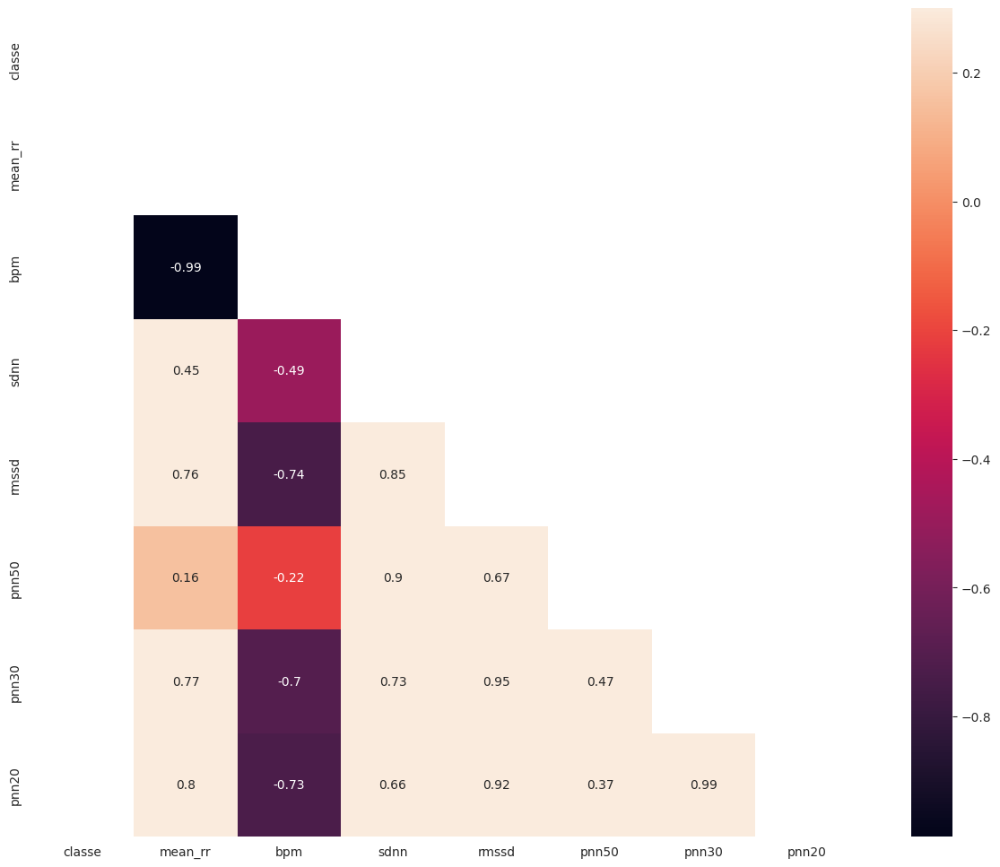

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


#faz um mapa de calor e correlação positiva e negativa
df = pd.DataFrame.from_dict(NoCAN)
corr = df.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(15, 12))
    ax = sns.heatmap(corr, mask=mask, vmax=.3, square=True, annot=True)

## Concatenação de Dados de Diabeticos e Não Diabeticos 

In [ ]:
import pandas as pd
from google.colab import files
import csv

drive.mount('/content/drive')

#caminho do arquivo
caminho_arquivo1 = '/content/drive/MyDrive/Trabalho de Classificação de Sinais/Sem outliers/NoCan sem Outliers.csv'
caminho_arquivo2 = '/content/drive/MyDrive/Trabalho de Classificação de Sinais/Sem outliers/EstCan sem Outliers.csv'

#definição
df1 = pd.read_csv(caminho_arquivo1)
df2 = pd.read_csv(caminho_arquivo2)

df_concatenado = pd.concat([df1, df2])

display(df_concatenado)



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,Unnamed: 0,classe,mean_rr,bpm,sdnn,rmssd,pnn50,pnn30,pnn20
0,0,0,0.680604,88.156949,18.636991,6.957806,0.000000,0.000000,0.721154
1,1,0,0.808311,74.228897,23.472791,14.296453,0.000000,2.571429,17.142857
2,2,0,1.094461,54.821507,26.831766,29.313094,4.104478,27.985075,49.253731
3,3,0,0.934312,64.218371,35.597676,36.708700,12.457912,35.353535,50.168350
4,4,0,0.888391,67.537806,30.445078,31.695150,10.591900,40.809969,60.436137
0,0,1,1.139469,52.656106,18.358642,21.904995,0.000000,16.342412,45.914397
1,1,1,0.695545,86.263234,6.419475,7.407786,0.000000,0.000000,0.000000
2,2,1,0.908569,66.037931,34.769351,22.853904,3.134796,10.971787,25.078370
3,3,1,0.719570,83.383168,9.944622,4.692505,0.000000,0.000000,0.245098
4,4,1,0.888226,67.550367,11.465393,8.535025,0.000000,0.000000,1.916933


In [ ]:
# Salva o DataFrame em um arquivo CSV
df_concatenado.to_csv('dados concatenados.csv', sep=',', quoting=csv.QUOTE_NONE)

# Faz o download do arquivo
files.download('dados concatenados.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Correlação dos dados Em relação a Classe

In [ ]:
#Correlação em relação as classes 0 (Não diabeticos) e 1 (diabeticos)
df_concatenado.corr()['classe']

Unnamed: 0    0.342773
classe        1.000000
mean_rr      -0.113273
bpm           0.125290
sdnn         -0.641816
rmssd        -0.589057
pnn50        -0.591254
pnn30        -0.604084
pnn20        -0.561011
Name: classe, dtype: float64

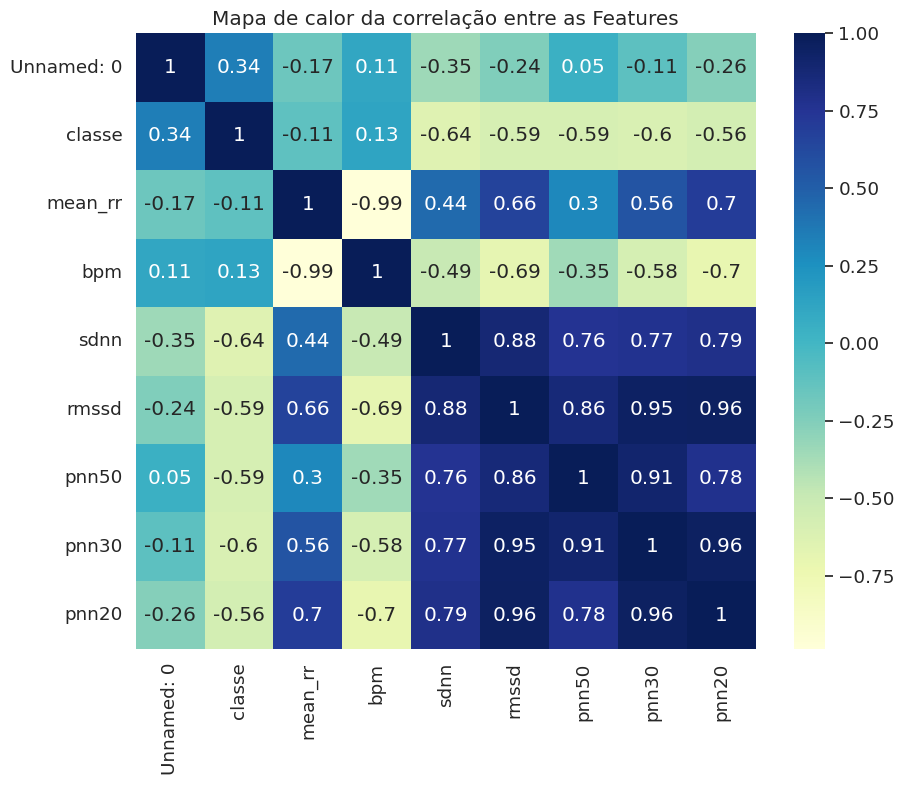

In [ ]:
import seaborn as sns
#Mapa de calor
corr = df_concatenado.corr()['classe']
df_corr = pd.DataFrame({'coluna': corr.index, 'correlacao': corr.values})
sns.set(font_scale=1.2)
sns.set_style("whitegrid")
plt.figure(figsize=(10,8))
sns.heatmap(df_concatenado.corr(), annot=True, cmap="YlGnBu")
plt.title('Mapa de calor da correlação entre as Features')
plt.show()

In [ ]:
#Seleção de Dados a serem utilizados
df_modelo = df_concatenado[['sdnn', 'rmssd', 'pnn50', 'pnn30', 'pnn20', 'classe']]
df_modelo

,sdnn,rmssd,pnn50,pnn30,pnn20,classe
0,18.636991,6.957806,0.000000,0.000000,0.721154,0
1,23.472791,14.296453,0.000000,2.571429,17.142857,0
2,26.831766,29.313094,4.104478,27.985075,49.253731,0
3,35.597676,36.708700,12.457912,35.353535,50.168350,0
4,30.445078,31.695150,10.591900,40.809969,60.436137,0
0,18.358642,21.904995,0.000000,16.342412,45.914397,1
1,6.419475,7.407786,0.000000,0.000000,0.000000,1
2,34.769351,22.853904,3.134796,10.971787,25.078370,1
3,9.944622,4.692505,0.000000,0.000000,0.245098,1
4,11.465393,8.535025,0.000000,0.000000,1.916933,1


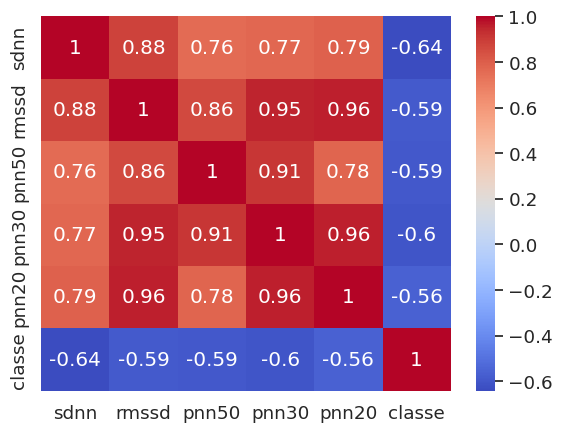

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calcula a matriz de correlação em relação à coluna "classe"
correlation_matrix = df_modelo[['sdnn', 'rmssd', 'pnn50', 'pnn30', 'pnn20', 'classe']].corr()

# Cria o mapa de calor
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

# Ajusta as margens do gráfico
plt.subplots_adjust(left=0.1, bottom=0.1)

# Exibe o mapa de calor
plt.show()

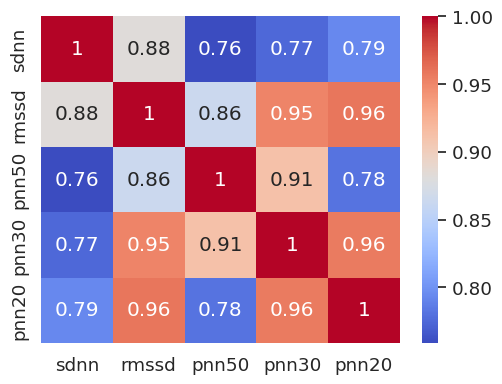

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Seleciona as colunas de interesse
columns_of_interest = ['sdnn', 'rmssd', 'pnn50', 'pnn30', 'pnn20']

# Calcula a matriz de correlação
correlation_matrix = df_modelo[columns_of_interest].corr()

# Cria o mapa de calor
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')

# Ajusta as margens do gráfico
plt.subplots_adjust(left=0.2, bottom=0.2)

# Exibe o mapa de calor
plt.show()

## Separação dos dados de Treino e Teste

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier

In [ ]:
df_train, df_val = train_test_split(df_modelo, train_size=0.7, stratify=df_modelo['classe'])

In [ ]:
y_train = df_train['classe']
df_train.drop('classe', axis=1, inplace=True)
df_train

,sdnn,rmssd,pnn50,pnn30,pnn20
5,13.379480,6.143218,0.000000,0.000000,0.271739
0,18.636991,6.957806,0.000000,0.000000,0.721154
3,35.597676,36.708700,12.457912,35.353535,50.168350
0,18.358642,21.904995,0.000000,16.342412,45.914397
1,23.472791,14.296453,0.000000,2.571429,17.142857
3,9.944622,4.692505,0.000000,0.000000,0.245098
7,6.205473,3.950342,0.000000,0.000000,0.000000
4,11.465393,8.535025,0.000000,0.000000,1.916933
2,34.769351,22.853904,3.134796,10.971787,25.078370


In [ ]:
y_val = df_val['classe']
df_val.drop('classe', axis=1, inplace=True)
df_val

,sdnn,rmssd,pnn50,pnn30,pnn20
4,30.445078,31.695150,10.591900,40.809969,60.436137
2,26.831766,29.313094,4.104478,27.985075,49.253731
6,7.198978,8.138229,0.000000,0.000000,0.668896
1,6.419475,7.407786,0.000000,0.000000,0.000000


In [ ]:
y_val

4    0
2    0
6    1
1    1
Name: classe, dtype: int64

## MLPClassifier

In [ ]:
clf_mlp = MLPClassifier(hidden_layer_sizes=(10, ), activation='logistic')
clf_mlp.fit(df_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPClassifier(activation='logistic', hidden_layer_sizes=(10,))

In [ ]:
y_pred_mlp = clf_mlp.predict(df_val)

In [ ]:
from sklearn.metrics import balanced_accuracy_score

In [ ]:
balanced_accuracy_score(y_val, y_pred_mlp)

0.5

## DecisionTree

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
clf_dt = DecisionTreeClassifier()
clf_dt.fit(df_train, y_train)

DecisionTreeClassifier()

In [ ]:
y_pred_dt = clf_dt.predict(df_val)

In [ ]:
balanced_accuracy_score(y_val, y_pred_dt)

1.0

## Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression

In [ ]:
clf_lr = LogisticRegression()
clf_lr.fit(df_train, y_train)

LogisticRegression()

In [ ]:
y_pred_lr = clf_lr.predict(df_val)

In [ ]:
balanced_accuracy_score(y_val, y_pred_lr)

0.75

In [ ]:
y_pred_lr

array([0, 1, 1, 1])

## Floresta Aleatoria 

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import confusion_matrix

# Treinando o modelo de Floresta Aleatória
clf_fa = RandomForestClassifier()
clf_fa.fit(df_train, y_train)

# Fazendo previsões no conjunto de validação
y_pred_fa = clf_fa.predict(df_val)

# Calculando a acurácia balanceada para o modelo de Floresta Aleatória
acc_fa = balanced_accuracy_score(y_val, y_pred_fa)

# Obtendo a matriz de confusão
cm = confusion_matrix(y_val, y_pred_fa)


print(f"Acurácia balanceada para Floresta Aleatória: {acc_fa:.2f}")

Acurácia balanceada para Floresta Aleatória: 1.00


In [ ]:
y_pred_fa

array([0, 0, 1, 1])

In [ ]:
cm

array([[2, 0],
       [0, 2]])

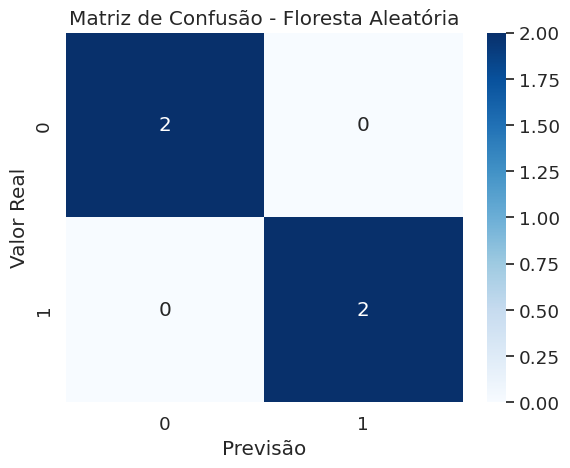

In [ ]:
# Exibindo a matriz de confusão de forma gráfica
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Previsão")
plt.ylabel("Valor Real")
plt.title("Matriz de Confusão - Floresta Aleatória")
plt.show()

## KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import balanced_accuracy_score, confusion_matrix

# Treinando o modelo k-NN
clf_knn = KNeighborsClassifier()
clf_knn.fit(df_train, y_train)

# Fazendo previsões no conjunto de validação
y_pred_knn = clf_knn.predict(df_val)

# Calculando a acurácia balanceada para o modelo k-NN
acc_knn = balanced_accuracy_score(y_val, y_pred_knn)


print(f"Acurácia balanceada para k-NN: {acc_knn:.2f}")

Acurácia balanceada para k-NN: 0.75


In [ ]:

# Obtendo a matriz de confusão
cmknn = confusion_matrix(y_val, y_pred_knn)

In [ ]:
cmknn

array([[1, 1],
       [0, 2]])

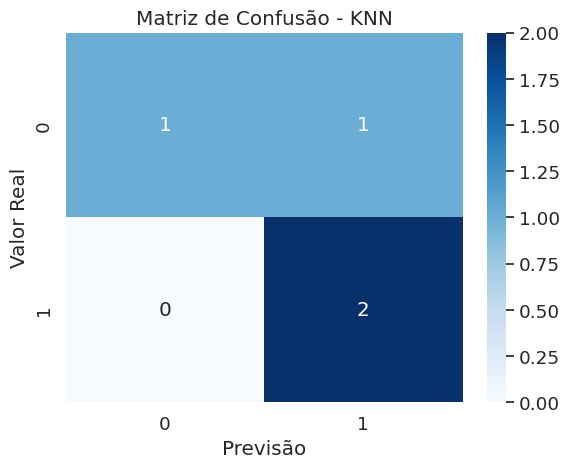

In [ ]:
# Exibindo a matriz de confusão de forma gráfica
sns.heatmap(cmknn, annot=True, fmt="d", cmap="Blues")
plt.xlabel("Previsão")
plt.ylabel("Valor Real")
plt.title("Matriz de Confusão - KNN")
plt.show()